# Machine Learning Challenge N°1

Import all libraries you need.

In this example there are only libraries needed for the example code.

In [87]:
import matplotlib.pylab as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.datasets import load_breast_cancer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.svm import LinearSVC
from sklearn.decomposition import PCA, NMF
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from sklearn.preprocessing import Normalizer

## Read the data.

In this challenge you will use the toy dataset Breast Cancer Wisconsin (Diagnostic) Database.

In the following example, how to load and read  the infos of  this dataset.


In [88]:
breast_dataset = load_breast_cancer()
# let's print the dataset description
print(breast_dataset.DESCR+"\n\n")

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [89]:
# let's print the size of the dataset
print("Size:" +str(breast_dataset.data.shape)+"\n")
# let's print the features names
print("Features:\n"+str(breast_dataset.feature_names)+"\n")
# let's print the class names
print("Classes:\n"+str(breast_dataset.target_names))

Size:(569, 30)

Features:
['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']

Classes:
['malignant' 'benign']


## Generate baseline classifier using all "raw" features 

In [90]:
# Convert the scikit-learn dataset into pandas dataset
breast_data_pd = pd.DataFrame(breast_dataset.data,columns=breast_dataset.feature_names)
breast_data_pd['target'] = breast_dataset.target

In [91]:
# DO NOT MODIFY THE FOLLOWING SPLIT OF THE DATASET
X_train, X_test, y_train, y_test = train_test_split(
    breast_dataset.data, breast_dataset.target, stratify=breast_dataset.target, random_state=42
) # Default slplitting reserves 25% for test 75% for training.

Don't modify this part where we train a 3-NN classifier and evaluate the accuracy on the test set.

In [92]:
#DO NOT MODIFY THE CLASSIFIER AND THE PERFORMANCE EVALUATION
knn = KNeighborsClassifier(n_neighbors=3)
scores = cross_val_score(knn, X_train, y_train)

# Show prediction accuracy
print(f'\n Mean prediction accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics = {'baseline': [scores.mean(), scores.std()]}


 Mean prediction accuracy: 0.92+/-0.01


## Study the features.

As an example, in the following code we use pandas (after a conversion from a  scikit-learn dataset to a pandas dataset) and seaborn libraries to:
- build a scatter matrix to study the covariance between features (in the example, all features are used, but you can plot only the features you need)
- build a heatmap of correlation between features (again of all features, but you can choose what you need) using the Pearson correlation coefficient

<Figure size 2160x2160 with 0 Axes>

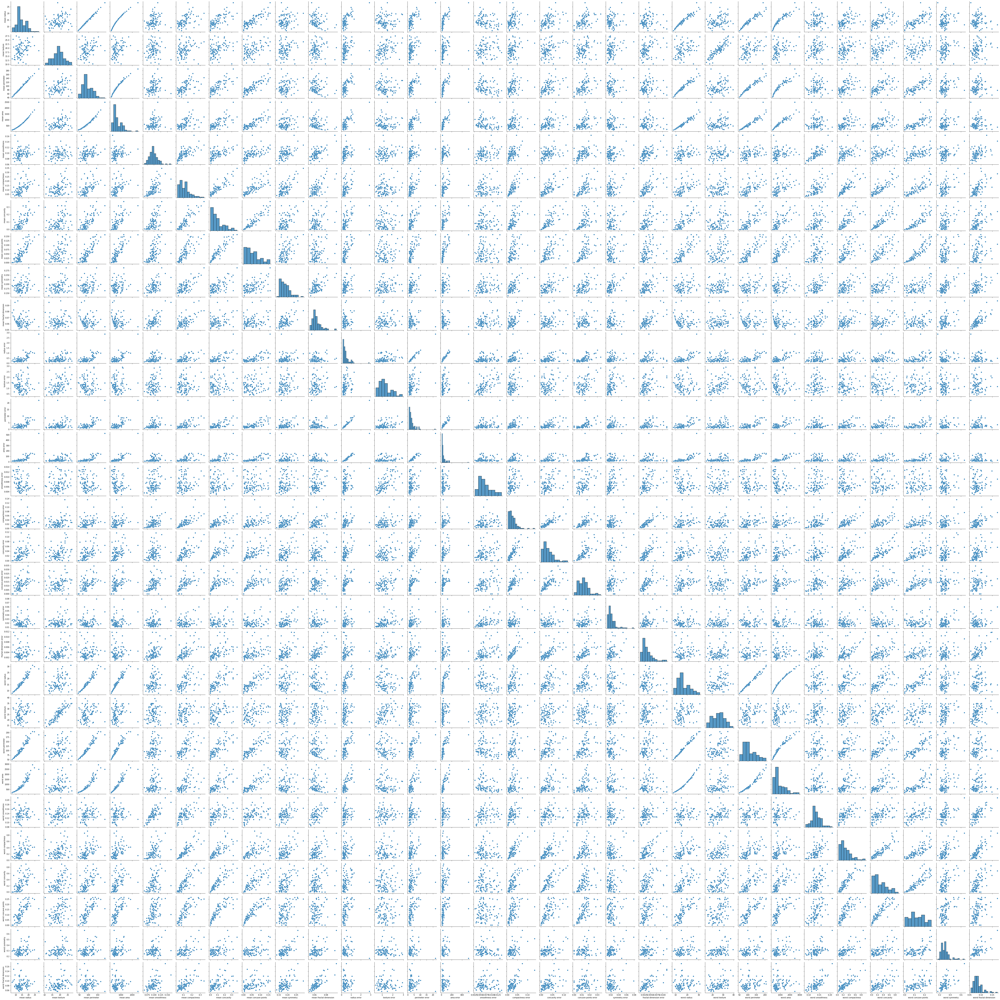

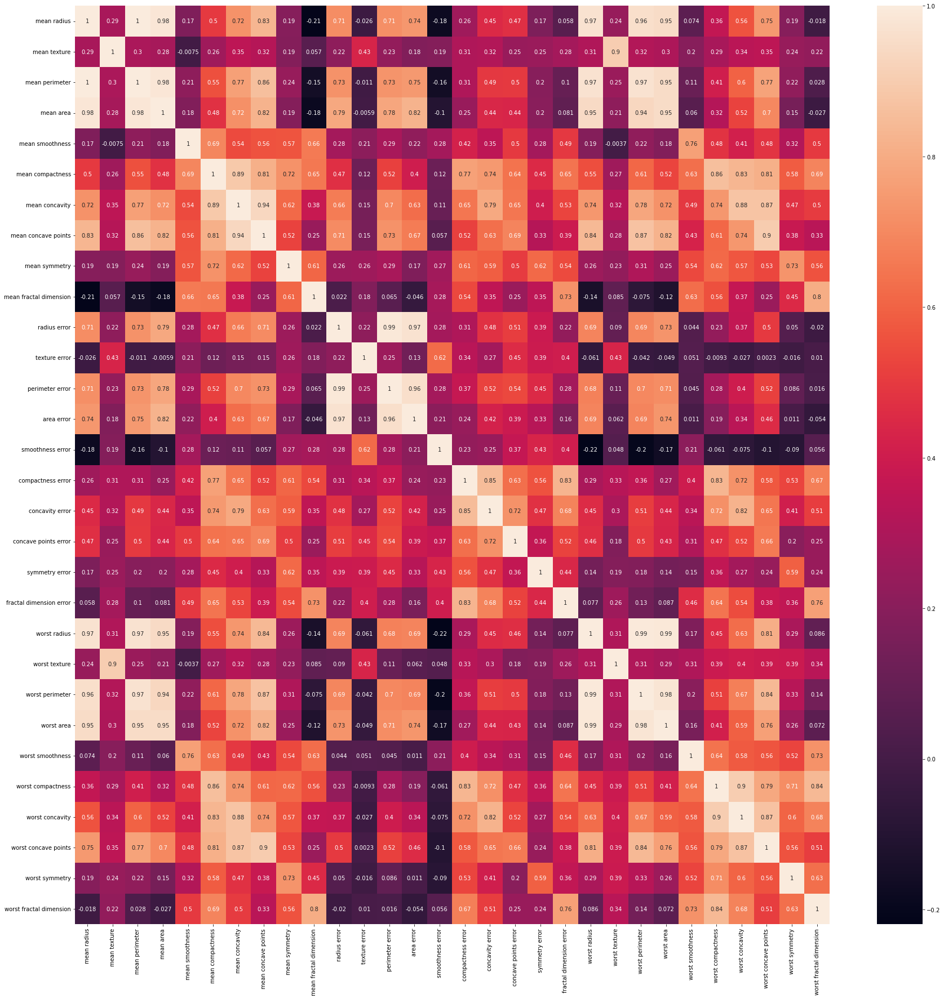

In [7]:
# # Plot the scatter matrix
# plt.figure(figsize=(30, 30))
# sns.pairplot(breast_data_pd[breast_dataset.feature_names].sample(100, random_state=12))
# plt.show()

# # Correlation plot
# corr = (breast_data_pd[breast_dataset.feature_names].sample(100, random_state=12)).corr()
# plt.figure(figsize=(30, 30))
# sns.heatmap(corr, annot=True)
# plt.show()

#### First of all we are going to generate a new df from only the training examples in order not to introduce a bias during the data analysis.

In [93]:
breast_data_pd_original = breast_data_pd.copy()
breast_data_pd = pd.DataFrame(data=X_train, columns = breast_dataset.feature_names)
breast_data_pd['target'] = y_train

### Classification performance on one dimension

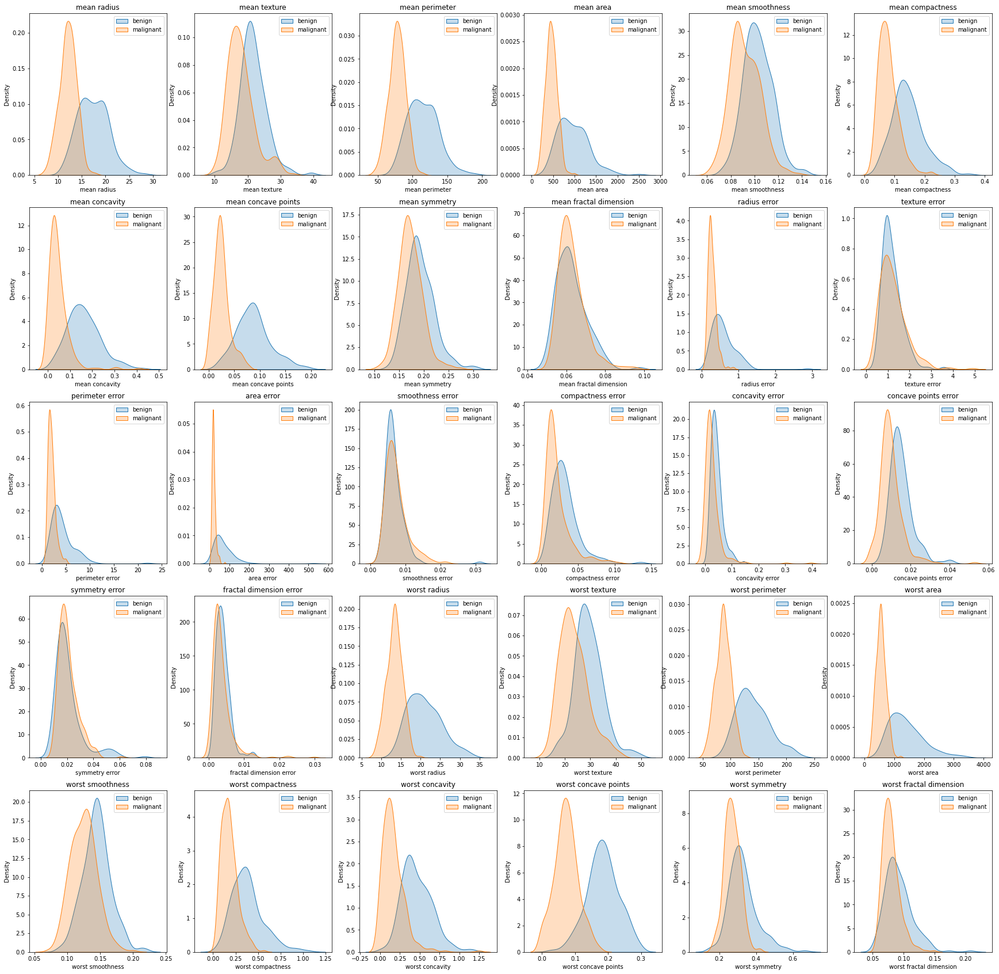

In [9]:
# colors = sns.color_palette()
# # Correlation plot
# fig, ax = plt.subplots(nrows=5, ncols=6, figsize=(30, 30))
# for k, i in enumerate(breast_dataset.feature_names):
#     ax[k//6, k%6].set_title(i)
#     sns.kdeplot(
#         data=breast_data_pd.loc[breast_data_pd.target==0, i], ax=ax[k//6, k%6], fill=True,
#         label='benign', color=colors[0]
#     )
#     sns.kdeplot(
#         data=breast_data_pd.loc[breast_data_pd.target==1, i], ax=ax[k//6, k%6], fill=True,
#         label='malignant', color=colors[1], legend=True
#     )
#     ax[k//6, k%6].legend()

#### In the upper kde plots we can see that some variables aare more discriminative than others, for example *worst concave points* is a more discriminative feature than mean symetry or mean fractal dimension.

#### Is also important to notice than none of the features offers the possibility to choose a perfect decision threshold.

#### We can analyse the classification results that can be obtained by each feature:

In [94]:
feat_knn = np.zeros((30))
best = 0
feat =  ''
for i in range(30):
    knn = KNeighborsClassifier(n_neighbors=3)
    scores = cross_val_score(knn, X_train[:, i].reshape((-1,1)), y_train)
    feat_knn[i] = scores.mean()
    if feat_knn[i] > 0.9:
        print(f'Feature: {breast_data_pd.columns[i]} ---- '
              f'Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
        if feat_knn[i] > best:
            feat = breast_data_pd.columns[i]
            metrics = [scores.mean(), scores.std()]
print(f'Best feature: {feat}')
benchmark_metrics[f'manual_single-{feat}'] = metrics

Feature: mean concave points ---- Mean accuracy: 0.91+/-0.01
Feature: worst radius ---- Mean accuracy: 0.90+/-0.02
Feature: worst perimeter ---- Mean accuracy: 0.91+/-0.03
Feature: worst area ---- Mean accuracy: 0.91+/-0.03
Best feature: worst area


 ####  We can see that even one feature (related to the plts seen before) can already give us some nice results.
 #### If we increase the dimensionality of the analysis in one, allowing us to see combinations of features:

### Classification performace on two dimensions

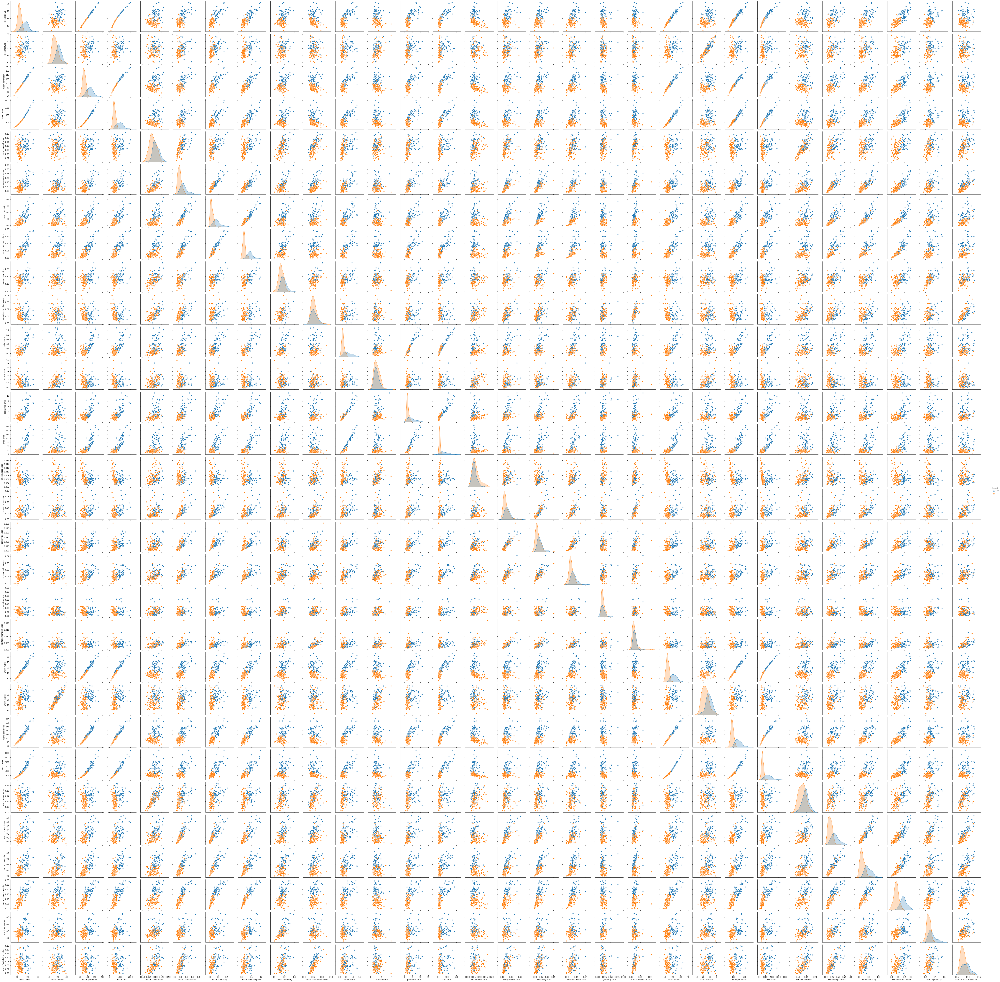

In [10]:
# sns.pairplot(
#     data=(breast_data_pd.sample(150, random_state=12)),
#     hue='target'
# )
# plt.show()

#### If we analyse the classification performace of the knn classifier using all feature pairs:

In [95]:
pairs_feat_knn = np.zeros((30,30))
pairs_feat_knn_std = np.zeros((30,30))
for i in range(30):
    for j in range(i, 30):
        knn = KNeighborsClassifier(n_neighbors=3)
        scores = cross_val_score(knn, X_train[:, [i,j]], y_train)
        pairs_feat_knn[i,j] = scores.mean()
        pairs_feat_knn_std[i,j] = scores.std()

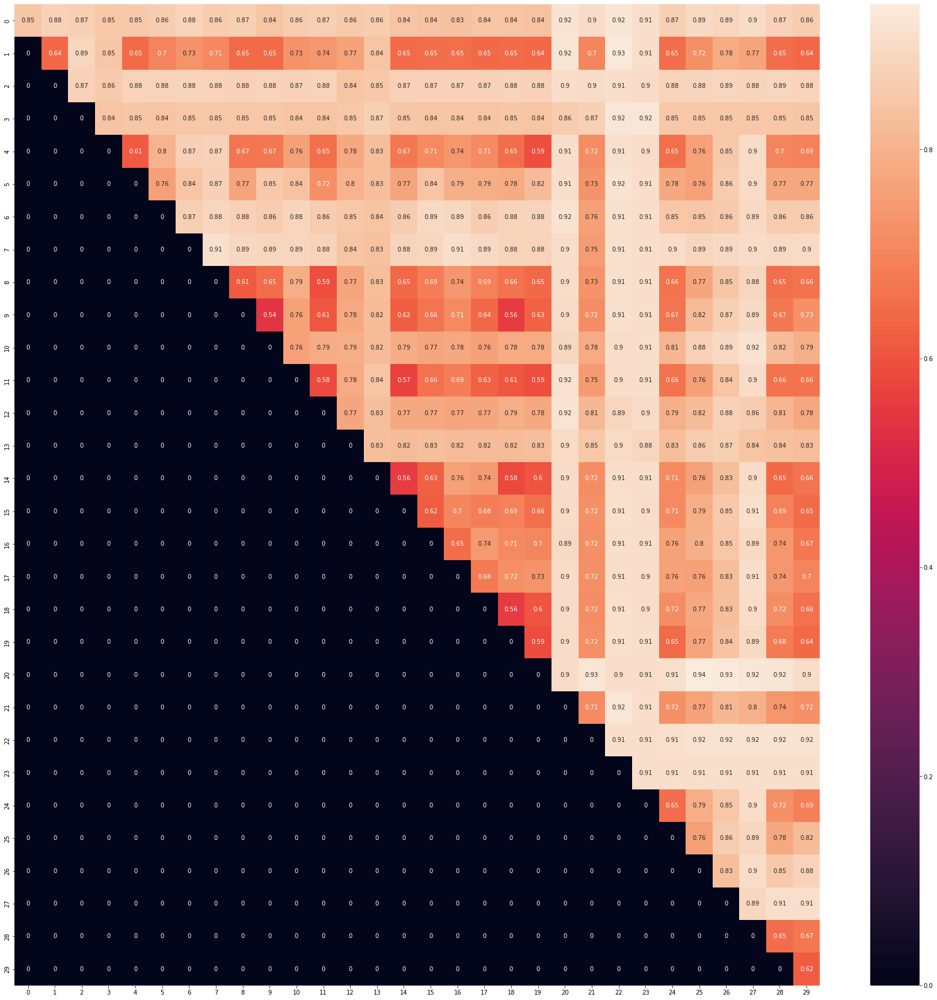

In [14]:
# plt.figure(figsize=(30,30))
# sns.heatmap(pairs_feat_knn, annot=True)
# plt.show()

#### We can see that there are some feature pairs that already give us better results that using all of them. 

In particular:

In [96]:
best = 0
feat = ''
print('Pairs')
for i in zip(np.where(pairs_feat_knn > 0.9301)[0], np.where(pairs_feat_knn > 0.9301)[1]):
    print(
        f'{breast_data_pd.columns[i[0]]} - {breast_data_pd.columns[i[1]]} '
        f'--- Mean accuracy: {pairs_feat_knn[i[0], i[1]]:.2f}+/-{pairs_feat_knn_std[i[0], i[1]]:.2f}'
    )
    if pairs_feat_knn[i[0], i[1]] > best:
        feat = f'{breast_data_pd.columns[i[0]]} - {breast_data_pd.columns[i[1]]}'
        metrics = [pairs_feat_knn[i[0], i[1]], pairs_feat_knn_std[i[0], i[1]]]
print(f'Best feature: {feat}')
benchmark_metrics[f'{feat}'] = metrics

Pairs
mean texture - worst perimeter --- Mean accuracy: 0.93+/-0.03
worst radius - worst compactness --- Mean accuracy: 0.94+/-0.03
worst radius - worst concavity --- Mean accuracy: 0.93+/-0.02
Best feature: worst radius - worst concavity


#### We can see that the pair *worst radius - worst compactness* gives us a mean accuracy of 0.94, higher thant the baseline.

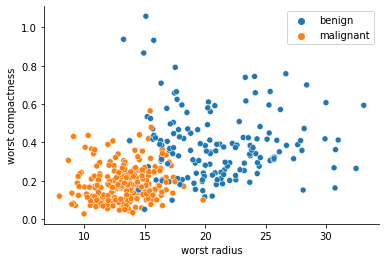

In [97]:
sns.scatterplot(
    x=breast_data_pd['worst radius'],
    y=breast_data_pd['worst compactness'], 
    hue=np.where(breast_data_pd['target'].values==1, 'malignant', 'benign')
)
sns.despine()
plt.show()

## Feature transformation

First we check the ranges in which each feature varies

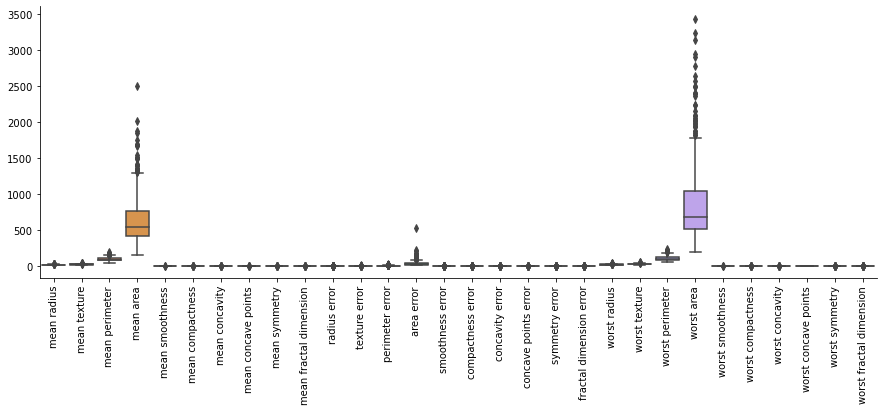

In [98]:
plt.figure(figsize=(15,5))
sns.boxplot(data=breast_data_pd.loc[:,breast_data_pd.columns!='target'])
plt.xticks(rotation=90)
sns.despine()
plt.show()

We can clearly observe that the ranges of some features are much larger than others.

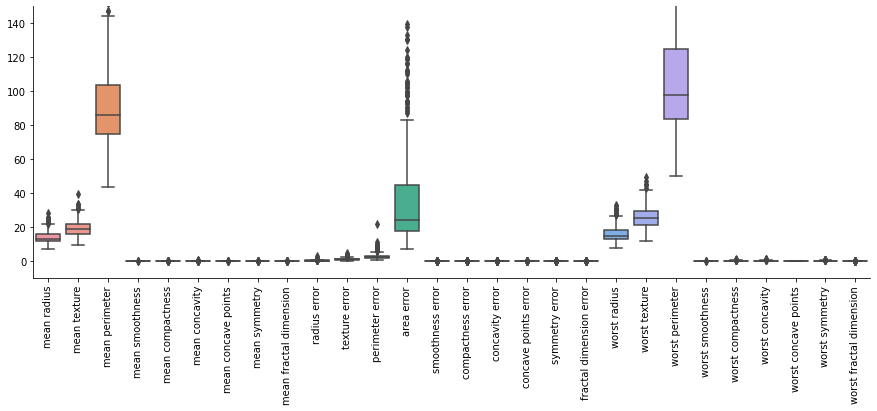

In [99]:
plt.figure(figsize=(15,5))
sns.boxplot(data=breast_data_pd.loc[:,~breast_data_pd.columns.isin(['target', 'mean area', 'worst area'])])
plt.xticks(rotation=90)
sns.despine()
plt.ylim([-10,150])
plt.show()

Even removing the most wide-spread ones, there's still a lot of variance in the ranges.

### Standarize (normalize) the features:

In [100]:
# Z-SCORE
pipe = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors=3))
scores = cross_val_score(pipe, X_train, y_train)
print(f'Z-Score Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'z-score_all'] = [scores.mean(), scores.std()]

# MIN-MAX
pipe = make_pipeline(MinMaxScaler(), KNeighborsClassifier(n_neighbors=3))
scores = cross_val_score(pipe, X_train, y_train)
print(f'Min-Max Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'min-max_all'] = [scores.mean(), scores.std()]

# MAX-ABS
pipe = make_pipeline(MaxAbsScaler(), KNeighborsClassifier(n_neighbors=3))
scores = cross_val_score(pipe, X_train, y_train)
print(f'Max-Abs Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'max-abs_all'] = [scores.mean(), scores.std()]


Z-Score Mean accuracy: 0.96+/-0.02
Min-Max Mean accuracy: 0.96+/-0.02
Max-Abs Mean accuracy: 0.96+/-0.01


In [101]:
pipe = make_pipeline(Normalizer(), KNeighborsClassifier(n_neighbors=3))
scores = cross_val_score(pipe, X_train, y_train)
print(f'Normalizer Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'normalizer_all'] = [scores.mean(), scores.std()]

Normalizer Mean accuracy: 0.92+/-0.01


From now on the standarization with z-score is kept

### Trying polynomial features

In [103]:
from sklearn.preprocessing import PolynomialFeatures

pipe = make_pipeline(PolynomialFeatures(3, interaction_only=True), KNeighborsClassifier(n_neighbors=3))
scores = cross_val_score(pipe, X_train, y_train)
print(f'Polynomial Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'polynomial_all'] = [scores.mean(), scores.std()]

Polynomial Mean accuracy: 0.90+/-0.01


### Combining Polynomial and Standarization

In [104]:
from sklearn.preprocessing import PolynomialFeatures

pipe = make_pipeline(StandardScaler(), PolynomialFeatures(2, interaction_only=True), KNeighborsClassifier(n_neighbors=3))
scores = cross_val_score(pipe, X_train, y_train)
print(f'Polynomial+ZS Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'zs-polynomial_all'] = [scores.mean(), scores.std()]

Polynomial+ZS Mean accuracy: 0.93+/-0.01


### Feature Selection

#### KBest

In [105]:
pipe = Pipeline(
    [
        ("norm", MinMaxScaler()),
        ("reduce_dim", "passthrough"),
        ("knn", KNeighborsClassifier(n_neighbors=3)),
    ]
)

N_FEATURES_OPTIONS = np.arange(2,30)
param_grid = [
    {
        "reduce_dim": [SelectKBest()],
        "reduce_dim__k": N_FEATURES_OPTIONS,
        "reduce_dim__score_func": [chi2, mutual_info_classif, f_classif],
    },
]

grid = GridSearchCV(pipe, n_jobs=-1, param_grid=param_grid, cv=10)
grid.fit(X_train, y_train)

mean_scores = np.array(grid.cv_results_["mean_test_score"])
std_scores = np.array(grid.cv_results_['std_test_score'])

#### the best  performing k best feature extraction was:

In [106]:
grid.best_estimator_

Pipeline(steps=[('norm', MinMaxScaler()),
                ('reduce_dim',
                 SelectKBest(k=23,
                             score_func=<function mutual_info_classif at 0x7fdd8d104e50>)),
                ('knn', KNeighborsClassifier(n_neighbors=3))])

In [107]:
pipe = make_pipeline(
    MinMaxScaler(),
    SelectKBest(score_func=mutual_info_classif, k=22),
    KNeighborsClassifier(n_neighbors=3)
)
scores = cross_val_score(pipe, X_train, y_train)
print(f'feat_sel_k_best Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'feat_sel_k_best'] = [scores.mean(), scores.std()]

Polynomial+ZS Mean accuracy: 0.97+/-0.03


#### Model Based feature selection

In [108]:
pipe = Pipeline(
    [
        ("norm", MinMaxScaler()),
        ('feature_selection', SelectFromModel(ExtraTreesClassifier(n_estimators=50))),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)
scores = cross_val_score(pipe, X_train, y_train)
print(f'SelectFromModel Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'feat_sel_Tree'] = [scores.mean(), scores.std()]

SelectFromModel Mean accuracy: 0.94+/-0.02


### Feature Transformation using PCA

In [109]:
pipe = Pipeline(
    [
        ('feature_selection', PCA(whiten=True)),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)
scores = cross_val_score(pipe, X_train, y_train)
print(f'SelectFromModel Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'PCA_whiten'] = [scores.mean(), scores.std()]

SelectFromModel Mean accuracy: 0.81+/-0.04


#### Variation of PCA n_components

In [110]:
pipe = Pipeline(
    [
        ("norm", StandardScaler()),
        ("reduce_dim", "passthrough"),
        ("knn", KNeighborsClassifier(n_neighbors=3)),
    ]
)

N_FEATURES_OPTIONS = np.arange(2,30)
param_grid = [
    {
        "reduce_dim": [PCA()],
        "reduce_dim__n_components": N_FEATURES_OPTIONS,
    },
]

grid = GridSearchCV(pipe, n_jobs=-1, param_grid=param_grid, cv=10)
grid.fit(X_train, y_train)

mean_scores = np.array(grid.cv_results_["mean_test_score"])
std_scores = np.array(grid.cv_results_['std_test_score'])

In [111]:
grid.best_estimator_

Pipeline(steps=[('norm', StandardScaler()), ('reduce_dim', PCA(n_components=7)),
                ('knn', KNeighborsClassifier(n_neighbors=3))])

In [112]:
pipe = Pipeline(
    [
        ("norm", StandardScaler()),
        ('feature_selection', PCA(n_components=7)),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)
scores = cross_val_score(pipe, X_train, y_train)
print(f'SelectFromModel Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'PCA_7'] = [scores.mean(), scores.std()]

SelectFromModel Mean accuracy: 0.96+/-0.02


#### LDA

In [113]:
pipe = Pipeline(
    [
        ("norm", StandardScaler()),
        ('feature_selection', LinearDiscriminantAnalysis(n_components=1)),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)
scores = cross_val_score(pipe, X_train, y_train)
print(f'SelectFromModel Mean accuracy: {scores.mean():.2f}+/-{scores.std():.2f}')
benchmark_metrics[f'LDA_1'] = [scores.mean(), scores.std()]

SelectFromModel Mean accuracy: 0.96+/-0.01


## Results analysis

In [120]:
results = np.array(list(benchmark_metrics.values()))

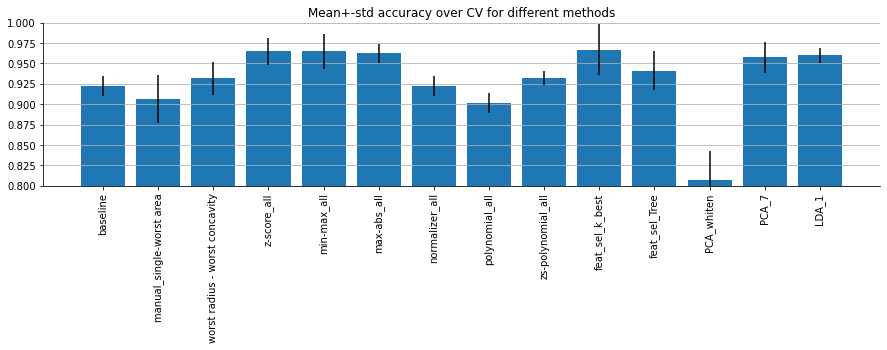

In [134]:
plt.figure(figsize=(15,3))
plt.bar(x=benchmark_metrics.keys(), height=results[:,0], yerr=results[:,1])
plt.ylim([0.8,1])
plt.title('Mean+-std accuracy over CV for different methods')
plt.grid(axis='y')
plt.xticks(rotation=90)
sns.despine()
plt.show()

#### We keep the 4 approaches that reach the highest values:

In [143]:
res_df = pd.DataFrame(index=benchmark_metrics.keys(), columns=['mean', 'std'], data=results)

In [146]:
res_df.loc[res_df['mean']>0.96,:]

,mean,std
z-score_all,0.964733,0.016677
min-max_all,0.964788,0.021046
max-abs_all,0.962408,0.011594
feat_sel_k_best,0.967086,0.031056
LDA_1,0.960055,0.009508


In [150]:
from sklearn.ensemble import VotingClassifier

pipe1 = Pipeline(
    [
        ("norm", StandardScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)

pipe2 = Pipeline(
    [
        ("norm", MinMaxScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)

pipe3 = Pipeline(
    [
        ("norm", MaxAbsScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)
pipe4 = Pipeline(
    [
        ("norm", StandardScaler()),
        ('feature_selection', LinearDiscriminantAnalysis(n_components=1)),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)
pipe5 = Pipeline(
    [
        ("norm", StandardScaler()),
        ('feature_selection', SelectKBest(score_func=f_classif, k=22)),
        ("knn", KNeighborsClassifier(n_neighbors=3))
    ]
)

eclf = VotingClassifier(
    estimators=[
        ('p1', pipe1), ('p2', pipe2), ('p3', pipe3), ('p4', pipe4)
    ],
    voting='hard'
)

for clf, label in zip(
    [pipe1, pipe2, pipe3, pipe4, pipe5, eclf],
    ['ZScore', 'MinMax', 'MaxAbs', 'LDA', 'Select22', 'Voting']
):
    scores = cross_val_score(clf, X_train, y_train, scoring='accuracy', cv=5)
    print("Accuracy: %0.3f (+/- %0.3f) [%s]" % (scores.mean(), scores.std(), label))

Accuracy: 0.965 (+/- 0.017) [ZScore]
Accuracy: 0.965 (+/- 0.021) [MinMax]
Accuracy: 0.962 (+/- 0.012) [MaxAbs]
Accuracy: 0.960 (+/- 0.010) [LDA]
Accuracy: 0.965 (+/- 0.025) [Select22]
Accuracy: 0.972 (+/- 0.018) [Voting]


## Final model evaluation on test set

In [159]:
eclf.fit(X_train,y_train)
scores = eclf.predict(X_test)
print('\nPrediction accuracy:')
print('{:.2%}\n'.format(accuracy_score(y_test, scores)))


Prediction accuracy:
97.90%

